<h2>1. Initial Set Up</h2>

In this notebook we will build a deep learning model using a CNN that is capable of detecting pneumonia in chest X-ray scans.

<h4>1.1 Importing Dependencies</h4>

In [1]:
# Imorting necessary libraries
from imutils import paths
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cv2
from pathlib import Path
import glob
import os
import random
import time
import PIL
import datetime

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from tensorflow.keras import Model, Sequential
from tensorflow.keras import layers 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.metrics as metrics

# Setting some variables for plotting via matplotlib
plt.rcParams["figure.figsize"] = (10, 10)
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15) 
plt.rc('lines', linewidth=3)
plt.rc('font', size=15)

In [2]:
#Checking tensorflow version
tf.__version__

'2.11.0'

In [3]:
#Checking python version
from platform import python_version 
python_version()

'3.9.12'

In [4]:
#Checking cv2 version
cv2.__version__

'4.7.0'

In [5]:
#Checking available hardware on local system
gpus = tf.config.experimental.list_physical_devices('GPU')
cpus = tf.config.experimental.list_physical_devices('CPU')

In [6]:
print(len(gpus)," GPU(s):",gpus)
print(len(cpus)," CPU(s):",cpus)

0  GPU(s): []
1  CPU(s): [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [7]:
#Fetching details of local hardware
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 8975044608108633470
 xla_global_id: -1]

In [8]:
#Avoid OOM errors by setting GPU memory consumption growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [9]:
#Setting random seeds inorder to ensure that output is reproduceable
import random

random.seed(10)
np.random.seed(10)
tf.random.set_seed(10)

<h4>1.2 Exploring the Dataset</h4>

In this section we will be analysing the distribution of our dataset and plotting the relevant graphs needed to gain an in-depth understanding of our dataset.

In [10]:
import imghdr
import cv2

In [11]:
#Setting root directory path
data_dir = 'dataset'

In [12]:
#Checking for sub-directories inside root directory
data_subdir = os.listdir(data_dir)
print(data_dir,"contains",data_subdir)

dataset contains ['test', 'train', 'val']


In [13]:
#Iterating through folders in sub-directories
for subdir in data_subdir:
    print(subdir,"set contains",len(os.listdir(data_dir+"/"+subdir)),"classes:",os.listdir(data_dir+"/"+subdir))

test set contains 2 classes: ['NORMAL', 'PNEUMONIA']
train set contains 2 classes: ['NORMAL', 'PNEUMONIA']
val set contains 2 classes: ['NORMAL', 'PNEUMONIA']


We can observe that our dataset is composed of 3 sub-directories : test, train and val. 
<br>Each of these sub-directories have 2 folders each: NORMAL and PNEUMONIA.

In [14]:
#Creating a dictionary that holds folder name as key and number of images in the folder as value
data_dict={}
for subdir in data_subdir:
    for image_classes in os.listdir(data_dir+"/"+subdir):
            if(image_classes != "affected"):
                data_dict.update({(subdir+"/"+image_classes):len(os.listdir(data_dir+"/"+subdir+"/"+image_classes))})
    
count=0
for i in data_dict:
    count+=1
    print("{} contains {} images, ".format(i,data_dict[i]),end=" ")
    if(count%3 == 0):
        print()

test/NORMAL contains 234 images,  test/PNEUMONIA contains 390 images,  train/NORMAL contains 1341 images,  
train/PNEUMONIA contains 3875 images,  val/NORMAL contains 8 images,  val/PNEUMONIA contains 8 images,  


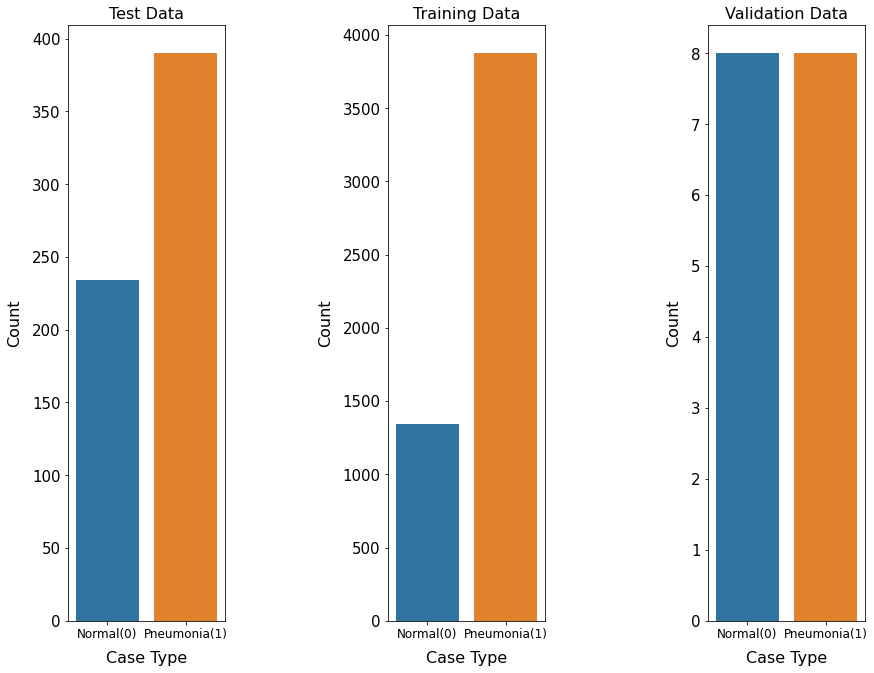

In [146]:
#Using the created dictionary to show the distribution of data between test, train and val datasets using a barchart
fig, axes = plt.subplots(1, 3, figsize = (15,12))
fig.tight_layout(pad=8.0)
count = 0
keys = []
for i in data_dict.keys():
    keys.append(i)

for i in range(3):
    temp = {}
    for j in range(2):
        temp.update({keys[count]:data_dict[keys[count]]})
        count+=1
    data_class = list(temp.keys())
    no_of_images = list(temp.values())  
    ax = sns.barplot(x = data_class, y = no_of_images, ax=axes[i])
    ax.set_xticklabels(['Normal(0)','Pneumonia(1)'], fontsize = 12)
    ax.set_xlabel('Case Type', fontsize = 16, labelpad = 10)
    ax.set_ylabel('Count', fontsize = 16, labelpad = 10)
    if(i==0):axes[i].set_title('Test Data',fontsize = 16)
    if(i==1):axes[i].set_title('Training Data',fontsize = 16)
    if(i==2):axes[i].set_title('Validation Data',fontsize = 16)
    
plt.savefig('data_dist.png', dpi=300, bbox_inches='tight')

From observing the graphs we can notice that there is a very skewed distribution of data among the various folders. We will handle this problem in later parts of this notebook

<h4>1.3 Removing Unfit images</h4>

In this section we will filter out all unwanted and impermissible image types that cannot be used for model training.

In [16]:
#Defining permissible image extension types 
image_exts = ['jpeg','jpg','bmp','png']

In [17]:
for data_subset in os.listdir(data_dir):
    print(data_subset)

test
train
val


In [18]:
#Iterating through every image in the dataset and checking if image extension is appropriate.
#Removing any unfit images if found.
flag = 0
for data_subset in os.listdir(data_dir):
    for image_class in os.listdir(os.path.join(data_dir,data_subset)):
        for image in os.listdir(os.path.join(data_dir,data_subset,image_class)):
            image_path = os.path.join(data_dir,data_subset,image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path) #returns image extension
            if tip not in image_exts:
                flag = 1
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))

if(flag ==0):print("No unfit images found")
        

No unfit images found


<h4>1.4 Loading the Data</h4>

In this section we will explore the distribution of images in our dataset and also plot a few images of both NORMAL and PNEUMONIA classes.

In [19]:
# Find and load normal image directories into a list
directory_test = 'dataset/test/NORMAL/'
directory_train = 'dataset/train/NORMAL/'
directory_val = 'dataset/val/NORMAL/'
image_paths_norm = sorted(list(paths.list_images(directory_test))) + \
                   sorted(list(paths.list_images(directory_train))) + \
                   sorted(list(paths.list_images(directory_val)))

# Declare a normal label list
labels_norm = ['Normal'] * len(image_paths_norm)

In [20]:
# Find and load pneumonia image directories into a list
directory_test_pn = 'dataset/test/PNEUMONIA/'
directory_train_pn = 'dataset/train/PNEUMONIA/'
directory_val_pn = 'dataset/val/PNEUMONIA/'
image_paths_pn = sorted(list(paths.list_images(directory_test_pn))) + \
                 sorted(list(paths.list_images(directory_train_pn))) + \
                 sorted(list(paths.list_images(directory_val_pn)))

# Declare a pneumonia label list for binary
labels_pn = ['Pneumonia'] * len(image_paths_pn)

# Merge the image and label lists together and turn them into NumPy arrays
image_paths = np.array(image_paths_norm + image_paths_pn)
labels = np.concatenate((labels_norm, labels_pn))

In [21]:
print("Total number of images in the dataset are",len(image_paths))

Total number of images in the dataset are 5856


In [22]:
colors = ['#ff7f0e', '#1f77b4'] 

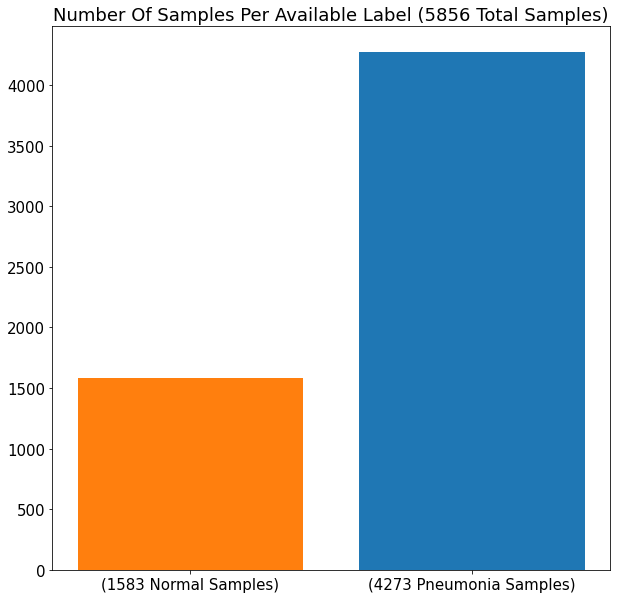

In [145]:
# Plot a bar with numbers of normal and pneumonia diagnoses
plt.bar([1, 2], height=[len(labels_norm), len(labels_pn)], 
        tick_label=['({0:d} Normal Samples)'.format(len(labels_norm)), 
                    '({0:d} Pneumonia Samples)'.format(len(labels_pn))], 
        color = colors
        )

plt.title('Number Of Samples Per Available Label ({0:d} Total Samples)'.
          format(len(labels_norm) + len(labels_pn)))
plt.savefig('plot.png', dpi=300, bbox_inches='tight')
plt.show()

Since there is a larger proportion of pneumonia samples in the image, the model will be able to easily learn and identify penumonia positive cases.

Now, let's plot a couple of images from each diagnosis to see how they look like.

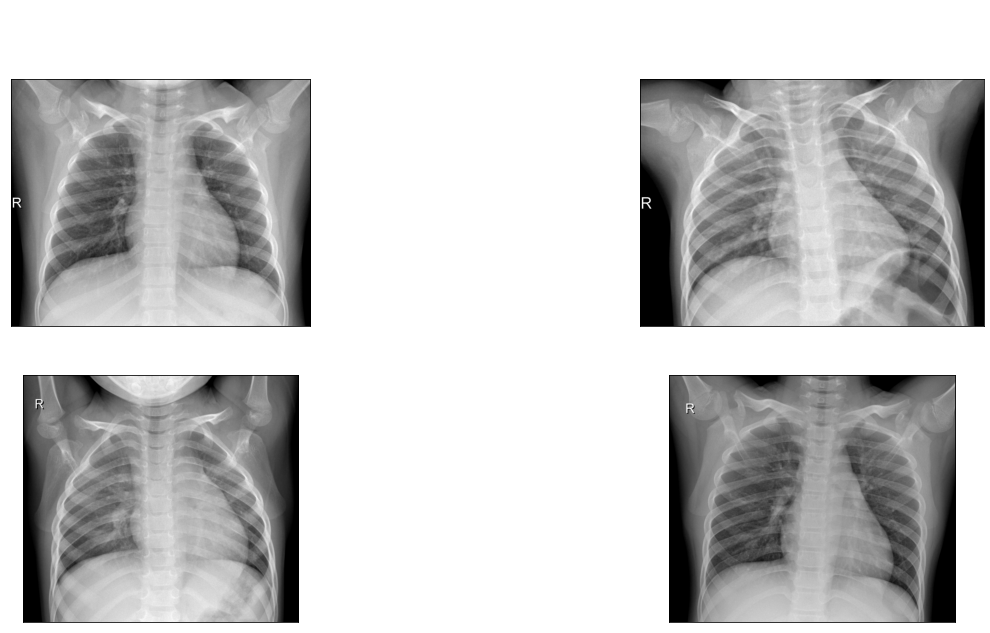

In [24]:
# Build a 2 x 2 figure
rows, columns = 2, 2
fig, axes = plt.subplots(rows, columns, figsize = (20,10))

# Choose random indices for image selection
norm_indices = np.random.choice(len(image_paths_norm), rows * columns)
pn_indices = np.random.choice(len(image_paths_pn), rows * columns)

# Make a list with images to plot
imgs_to_plot_norm = [image_paths_norm[i] for i in norm_indices]
imgs_to_plot_pn = [image_paths_pn[i] for i in pn_indices]

# Variable used for indending through the image list
current_index = 0

# Set figure title
fig.suptitle('4 Random Normal Samples',color='white')

# Plot normal images
for i in range(rows):
    for j in range(columns):
        img = load_img(imgs_to_plot_norm[current_index])        
        axes[i, j].imshow(img)
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        current_index +=1
        
plt.subplots_adjust(wspace=0.4, hspace=0.2)        
plt.show()

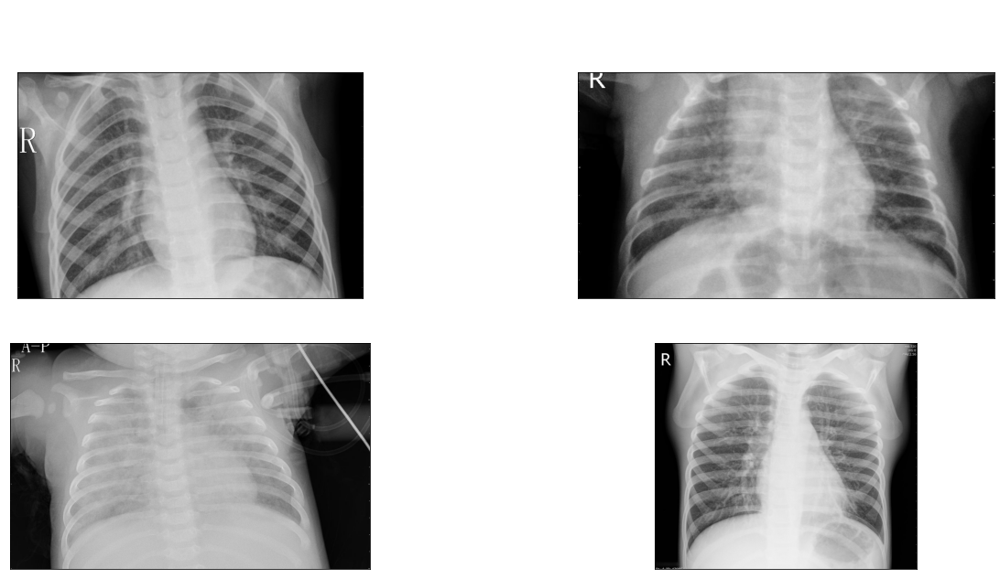

In [25]:
rows, columns = 2, 2
fig, axes = plt.subplots(rows, columns, figsize = (20,10))

current_index = 0

# Set figure title
fig.suptitle('4 Random Pneumonia Samples',color='white')

# Plot pneumonia images
for i in range(rows):
    for j in range(columns):
        img = load_img(imgs_to_plot_pn[current_index])        
        axes[i, j].imshow(img)
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        current_index +=1
        
plt.subplots_adjust(wspace=0.4, hspace=0.2) 
plt.show()

Generally, pneumonia manifests itself in alveoli consolidations mainly caused by bacteria and fluid. The differences between healthy and pneumonia X-Rays are pretty clearly visible, though in some images, the differences may not be as definite. 

<h4>1.5 Fixing the Training and Validation Data</h4>

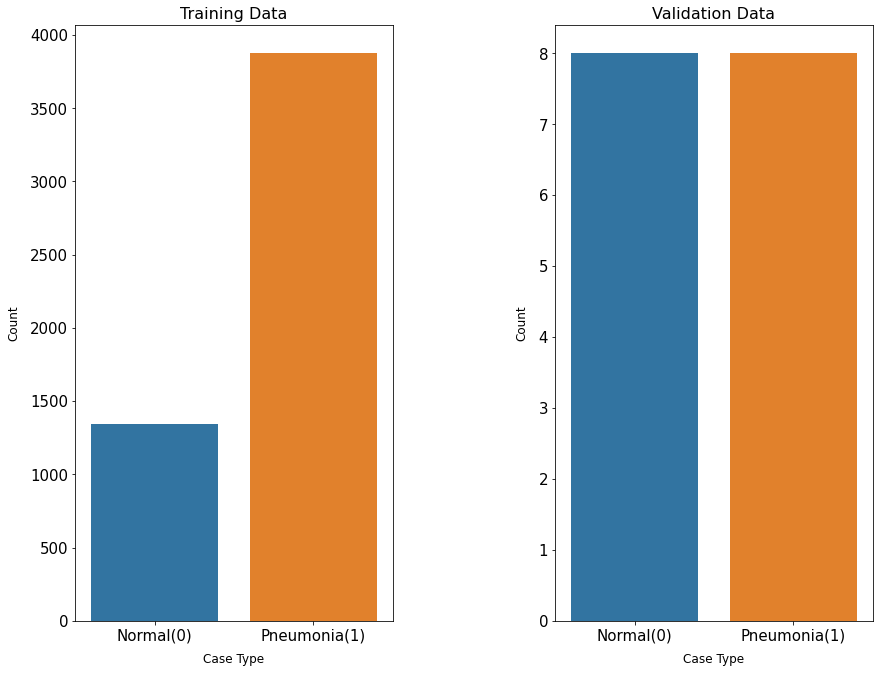

In [26]:
#Plotting graphs to visualise the distribution of images in the train and validation dataset
fig, axes = plt.subplots(1, 2, figsize = (15,12))
fig.tight_layout(pad=8.0)
count = 2
keys = []
for i in data_dict.keys():
    keys.append(i)

for i in range(2):
    temp = {}
    for j in range(2):
        temp.update({keys[count]:data_dict[keys[count]]})
        count+=1
    data_class = list(temp.keys())
    no_of_images = list(temp.values())  
    ax = sns.barplot(x = data_class, y = no_of_images, ax=axes[i])
    ax.set_xticklabels(['Normal(0)','Pneumonia(1)'])
    ax.set_xlabel('Case Type', fontsize = 12, labelpad = 10)
    ax.set_ylabel('Count', fontsize = 12, labelpad = 10)
    if(i==0):axes[i].set_title('Training Data',fontsize = 16)
    if(i==1):axes[i].set_title('Validation Data',fontsize = 16)
    


We can see that there are only 16 files in the validation set. It would be preferable to have a less extreme division between the training and validation sets.



Hence, we will use the train_test_split method to divide our dataset in a more consistent manner. We will first divide the dataset into a train set and a temporary test set, and then further divide the temporary test set into
the final test and validation sets.

The final split would be 70 : 15 : 15 between the train, test and validation datasets respectively.

In [27]:
from sklearn.model_selection import train_test_split

# Divide the image path & label arrays into train & test sets. This is done without loading images to save memory
X_train_dir, X_test_dir, y_train, y_test = \
                                           train_test_split(image_paths, labels, test_size=0.3)

# Divide the test set into validation (for use during training) and test (for post-training evaulation) sets
X_val_dir, y_val = X_test_dir[:len(X_test_dir) // 2], \
                   y_test[:len(y_test) // 2]

X_test_dir, y_test = X_test_dir[len(X_test_dir) // 2:], \
                     y_test[len(y_test) // 2:]

In [28]:
# Create DataFrames for the image generator
train_df = pd.DataFrame(np.transpose([X_train_dir, y_train]), 
                        columns=['filename', 'class'])

val_df = pd.DataFrame(np.transpose([X_val_dir, y_val]), 
                      columns=['filename', 'class'])

test_df = pd.DataFrame(np.transpose([X_test_dir, y_test]), 
                       columns=['filename', 'class'])

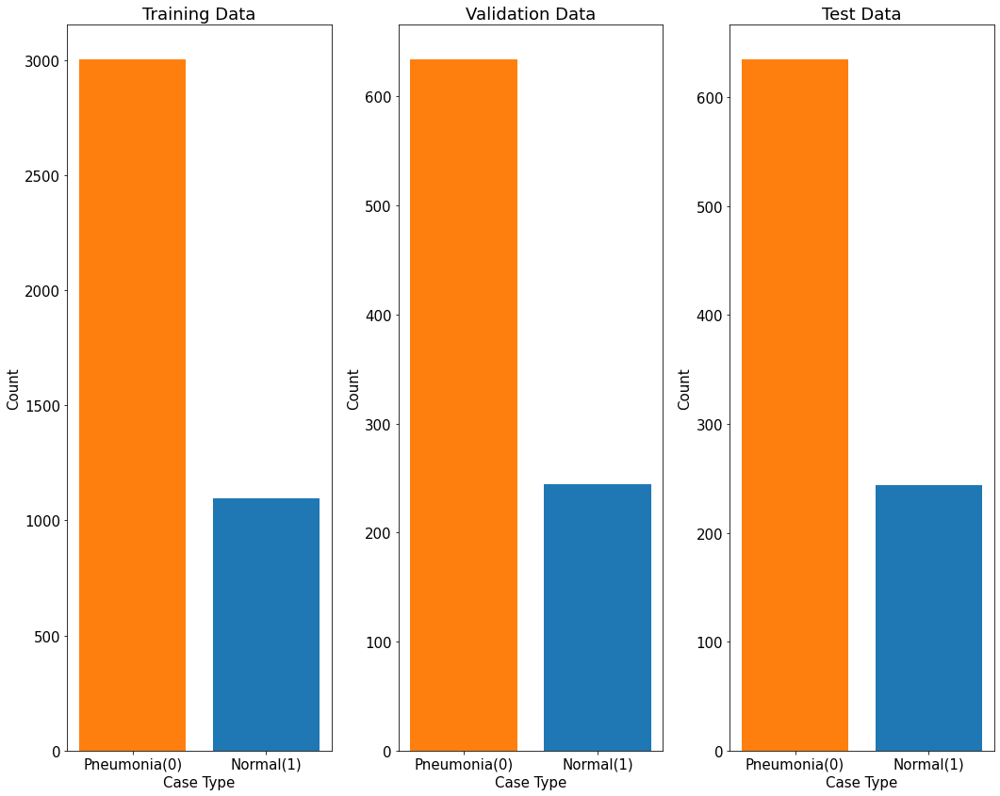

In [147]:
#Plot the final distribution between datasets
fig, axes = plt.subplots(1, 3, figsize=(15, 12))

for i, df in enumerate([train_df, val_df, test_df]):
    class_counts = df['class'].value_counts()
    axes[i].bar(['Pneumonia(0)', 'Normal(1)'], class_counts, color = colors)
    axes[i].set_title(['Training Data', 'Validation Data', 'Test Data'][i])
    axes[i].set_xlabel('Case Type')
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.savefig('new.png', dpi=300, bbox_inches='tight')
plt.show()

We can observe that the data distribution among the 3 datasets is now much more consistent.

<h2>2. Data Augmentation</h2>

<h4> 2.1 Data Pre-processing

Here we will explore the use of various filters that can be applied to the image

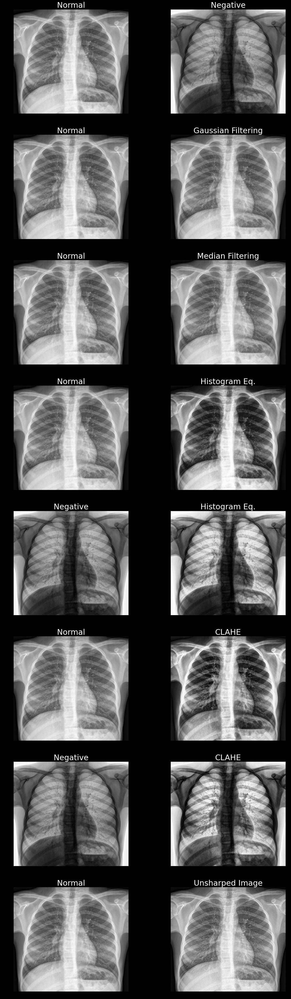

In [151]:
#Import the necessary libraries
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image

import skimage
from skimage.filters import unsharp_mask

#Reading a random image from the training set
img=cv2.imread(str(train_df['filename'].sample(n=1).iloc[0]))

#Creating a subplot of 8 rows and 2 columns
fig, axes = plt.subplots(8, 2, figsize = (20,70), facecolor='black')
  
#Creating and plotting a negative Image of the X-ray
img_neg = 255-img
axes[0,0].set_title("Normal", fontsize = 30, color = 'white')
axes[0,0].imshow(img)
axes[0,1].set_title("Negative", fontsize = 30, color = 'white')
axes[0,1].imshow(cv2.cvtColor(img_neg, cv2.COLOR_BGR2RGB))

#Applying Gaussian Blur on the X-ray Image
img_blur = cv2.GaussianBlur(img, (3,3), 0) 
axes[1,0].set_title("Normal", fontsize = 30, color = 'white')
axes[1,0].imshow(img)
axes[1,1].set_title("Gaussian Filtering", fontsize = 30, color = 'white')
axes[1,1].imshow(cv2.cvtColor(img_blur, cv2.COLOR_BGR2RGB))

#Applying Median Blur on the X-ray Image
img_median = cv2.medianBlur(img, 3)
axes[2,0].set_title("Normal", fontsize = 30, color = 'white')
axes[2,0].imshow(img)
axes[2,1].set_title("Median Filtering", fontsize = 30, color = 'white')
axes[2,1].imshow(cv2.cvtColor(img_median, cv2.COLOR_BGR2RGB))

#Applying Histogram Equalisation on the X-ray Image
lab_img1 = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l1, a1, b1 = cv2.split(lab_img1)
equ1 = cv2.equalizeHist(l1)
updated_lab_img1 = cv2.merge((equ1, a1, b1))
hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
axes[3,0].set_title("Normal", fontsize = 30, color = 'white')
axes[3,0].imshow(img)
axes[3,1].set_title("Histogram Eq.", fontsize = 30, color = 'white')
axes[3,1].imshow(cv2.cvtColor(hist_eq_img, cv2.COLOR_BGR2RGB))

#Applying Histogram Equalisation on the negative of the X-ray Image
lab_img2 = cv2.cvtColor(img_neg, cv2.COLOR_BGR2LAB)
l2, a2, b2 = cv2.split(lab_img2)
equ2 = cv2.equalizeHist(l2)
updated_lab_img2 = cv2.merge((equ2, a2, b2))
hist_eq_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
axes[4,0].set_title("Negative", fontsize = 30, color = 'white')
axes[4,0].imshow(img_neg)
axes[4,1].set_title("Histogram Eq.", fontsize = 30, color = 'white')
axes[4,1].imshow(cv2.cvtColor(hist_eq_img, cv2.COLOR_BGR2RGB))

#Applying Contrast Limiting Adaptive Histogram Equalisation (CLAHE) on the X-ray Image
clahe1 = cv2.createCLAHE(clipLimit = 3.0, tileGridSize = (4,4))
clahe_img1 = clahe1.apply(l1)
updated_lab_img3 = cv2.merge((clahe_img1, a1, b1))
CLAHE_img1 = cv2.cvtColor(updated_lab_img3, cv2.COLOR_LAB2BGR)
axes[5,0].set_title("Normal", fontsize = 30, color = 'white')
axes[5,0].imshow(img)
axes[5,1].set_title("CLAHE", fontsize = 30, color = 'white')
axes[5,1].imshow(cv2.cvtColor(CLAHE_img1, cv2.COLOR_BGR2RGB))

#Applying Contrast Limiting Adaptive Histogram Equalisation (CLAHE) on the negative X-ray Image
clahe2 = cv2.createCLAHE(clipLimit = 3.0, tileGridSize = (4,4))
clahe_img2 = clahe2.apply(l2)
updated_lab_img4 = cv2.merge((clahe_img2, a2, b2))
CLAHE_img2 = cv2.cvtColor(updated_lab_img4, cv2.COLOR_LAB2BGR)
axes[6,0].set_title("Negative", fontsize = 30, color = 'white')
axes[6,0].imshow(img_neg)
axes[6,1].set_title("CLAHE", fontsize = 30, color = 'white')
axes[6,1].imshow(cv2.cvtColor(CLAHE_img2, cv2.COLOR_BGR2RGB))

#Applying Unsharp Mask on the X-ray Image
unsharped_img = unsharp_mask(img, radius=3, amount=2)
axes[7,0].set_title("Normal", fontsize = 30, color = 'white')
axes[7,0].imshow(img)
axes[7,1].set_title("Unsharped Image", fontsize = 30, color = 'white')
axes[7,1].imshow(cv2.cvtColor(unsharped_img.astype('float32'), cv2.COLOR_BGR2RGB))

plt.show()

After performing a thorough research on image pre-processing techniques for X-rays, we reached a conclusion that a combination of median filtering, followed by application of CLAHE and Unsharpening is best to improve the clarity of the image.

In [152]:
#Defining the functions used to apply filters onto the image
from keras.preprocessing.image import ImageDataGenerator

#Function to convert image to negative
def apply_neg(image):
    img_neg = 255-image
    return img_neg

#Function to resize the to (512,512)
def apply_resizing(image):
    return cv2.resize(image, (512,512))

#Function to apply unsharp mask filter
def apply_unsharp_mask(image):
    unsharped_img = unsharp_mask(image, radius=3, amount=2)
    unsharped_img_uint8 = cv2.convertScaleAbs(unsharped_img * 255)
    return unsharped_img_uint8

#Function to convert the image to grayscale
def apply_grayscale(image):
    if len(image.shape) == 2 or image.shape[2] == 1:
        # Image is already grayscale
        return np.dstack([image, image, image])
    else:
        # Convert to grayscale
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return np.dstack([grayscale_image, grayscale_image, grayscale_image])


#Function to apply median filter 
def apply_median_filter(image):
    median = cv2.medianBlur(image, 5)
    return median

#Function to apply CLAHE 
def apply_CLAHE(image):
    if image.dtype != 'uint8':
        image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

    # Apply the CLAHE algorithm
    lab_img = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_img)
    clahe = cv2.createCLAHE(clipLimit = 3.0, tileGridSize = (4,4))
    clahe_img = clahe.apply(l)
    updated_lab_img = cv2.merge((clahe_img, a, b))
    CLAHE_img = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)
    return cv2.cvtColor(CLAHE_img, cv2.COLOR_BGR2RGB).astype('float64')

Let's visualise the final image after application of the aforementioned filters

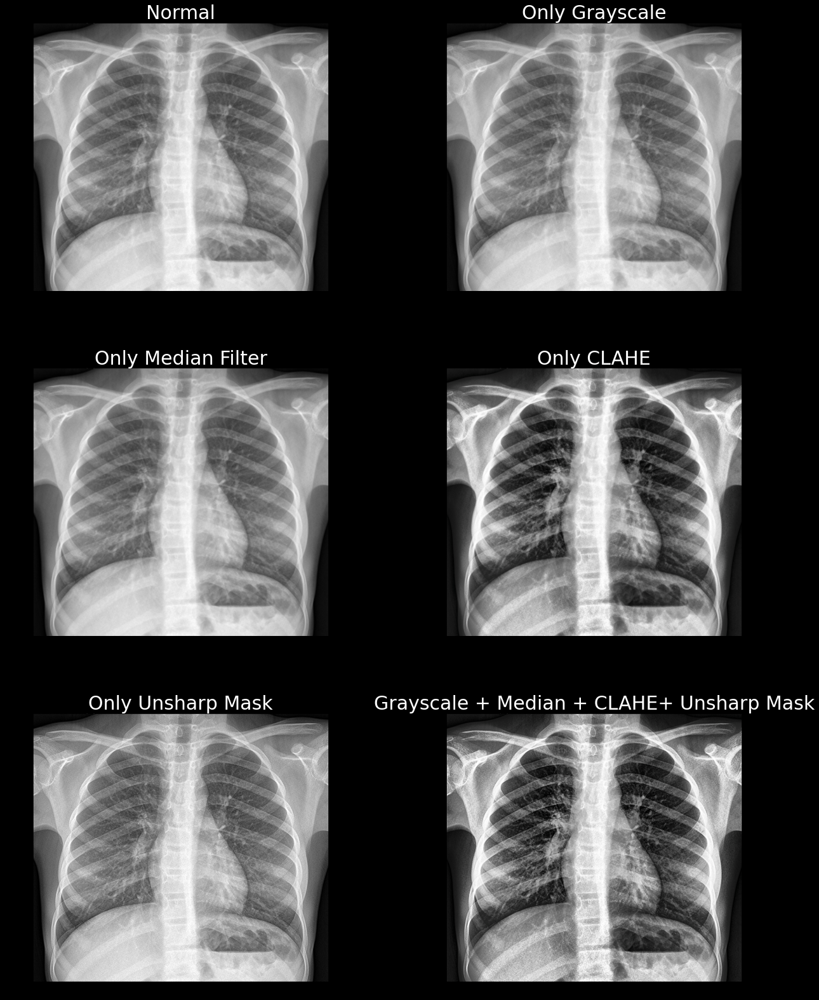

In [153]:
fig, axes = plt.subplots(3, 2, figsize = (20,70), facecolor = 'black')
axes[0,0].imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
axes[0,0].set_title("Normal", fontsize = 30, color = 'white')

axes[0,1].imshow(cv2.cvtColor(apply_grayscale(img),cv2.COLOR_BGR2RGB))
axes[0,1].set_title("Only Grayscale", fontsize = 30, color = 'white')

axes[1,0].imshow(cv2.cvtColor(apply_median_filter(img),cv2.COLOR_BGR2RGB))
axes[1,0].set_title("Only Median Filter", fontsize = 30, color = 'white')

axes[1,1].imshow(array_to_img(apply_CLAHE(img)))
axes[1,1].set_title("Only CLAHE", fontsize = 30, color = 'white')

axes[2,0].imshow(cv2.cvtColor(apply_unsharp_mask(img),cv2.COLOR_BGR2RGB))
axes[2,0].set_title("Only Unsharp Mask", fontsize = 30, color = 'white')

axes[2,1].imshow(array_to_img(apply_CLAHE(apply_unsharp_mask(apply_median_filter(apply_grayscale(img))))))
axes[2,1].set_title("Grayscale + Median + CLAHE+ Unsharp Mask", fontsize = 30, color = 'white')


plt.subplots_adjust(wspace=0.4, hspace=-0.8) 
plt.show()

We can see that this is a significant improvement over the original X-ray image.

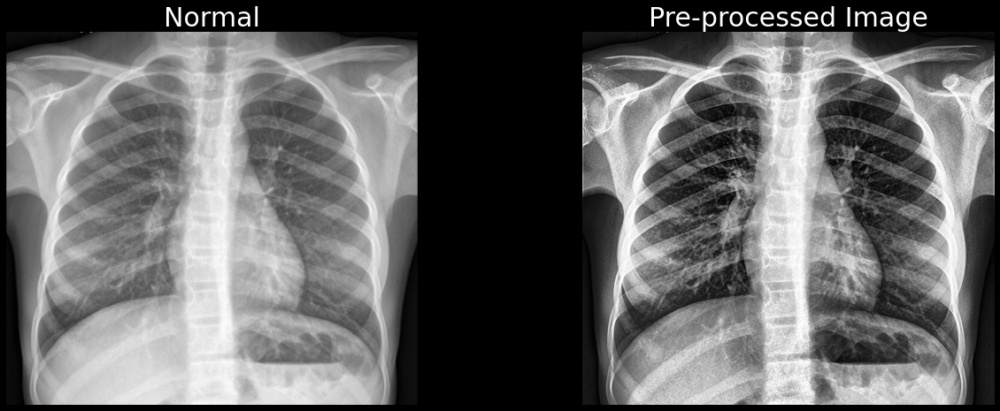

In [176]:
fig, axes = plt.subplots(1, 2, figsize = (20,70), facecolor = 'black')
axes[0].imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
axes[0].set_title("Normal", fontsize = 30, color = 'white')
axes[0].set_axis_off()


axes[1].imshow(array_to_img(apply_CLAHE(apply_unsharp_mask(apply_median_filter(apply_grayscale(img))))))
axes[1].set_title("Pre-processed Image", fontsize = 30, color = 'white')
axes[1].set_axis_off()


plt.subplots_adjust(wspace=0.4, hspace=-0.8) 

plt.savefig('pre-process.png', dpi=300, bbox_inches='tight')
plt.show()

<h4>2.2 Data Augmentation</h4>



Next, we have declared a *ImageDataGenerator* which will feed the input images to our model in the form of batches. We have considered the batch size to be of 32 images. We have also applied a few image augmentation techniques with the aim of reducing overfitting and making the model more robust and generalised.  

For data augmentation, we applied the following augmentation techniques:
1. Rescale: This was done to normalise the image and bring pixel values between [0,1] so that the model may train faster.
2. Zoom: A zoom range of 0.1 was used.
3. Heigh Shift: A height shift range of 0.05 was used.
4. Width Shift: A width shift range of 0.05 was used.
5. Rotation: A rotation range of 5 degrees was used.
6. Pre-processing function: A lambda function was used which applied resizing, grayscale and CLAHE onto the image.


The *ImageDataGenerator*'s would then generate images with the following properties:
1. Target image size (512 x 512). 
2. Color mode (grayscale).
3. Batch size (32).
4. Class mode (binary).
5. Shuffling (*True* for training data and *False* for validation & test data).



In [140]:
# Set the batch size for the generator and training
BATCH_SIZE = 32

# Declare an image generator for image augmentation
datagen = ImageDataGenerator(rescale = 1./255,
                             zoom_range=0.1, 
                             height_shift_range=0.05, 
                             width_shift_range=0.05,
                             rotation_range=5,
                             preprocessing_function = lambda img: apply_CLAHE(apply_grayscale(apply_resizing(img)))
                             #apply_CLAHE(apply_grayscale(apply_resizing(img))),
                             # dtype='float64'
                            )


# Declare an image generator for validation & testing without generation
test_datagen = ImageDataGenerator(rescale = 1./255)

# Declare generators for training, validation, and testing from DataFrames
train_gen = datagen.flow_from_dataframe(train_df,
                                        target_size=(512, 512),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='binary',
                                        shuffle=True)

val_gen = test_datagen.flow_from_dataframe(val_df,
                                        target_size=(512, 512),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='binary',
                                        shuffle=False)

test_gen = test_datagen.flow_from_dataframe(test_df,
                                        target_size=(512, 512),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='binary',
                                        shuffle=False)

Found 4099 validated image filenames belonging to 2 classes.
Found 878 validated image filenames belonging to 2 classes.
Found 879 validated image filenames belonging to 2 classes.


In order to increase the pipeline efficiency, we have created a *tf.Dataset* object. Thanks to this, we can use the *prefetch* method of the *tf.Dataset* class that allows the CPU or GPU to perform computations on the current batch while the next batch is being loaded into memory.

In [141]:
# Declare TensorFlow Datasets for more efficient training
train_data = tf.data.Dataset.from_generator(lambda: train_gen,
                                            output_types=(tf.float32, tf.int32),
                                            output_shapes=([None, 512, 512, 1], [None, ]))

val_data = tf.data.Dataset.from_generator(lambda: val_gen,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=([None, 512, 512, 1], [None, ]))

test_data = tf.data.Dataset.from_generator(lambda: test_gen,
                                           output_types=(tf.float32, tf.int32),
                                           output_shapes=([None, 512, 512, 1], [None, ]))

Now lets visualise a few images from the training data that have been augmented using our *datagen* Image Data Generator>

In [142]:
images_to_augment = []

for image_path in image_paths[:4]:
    image = load_img(image_path, target_size=(512, 512))
    image = img_to_array(image)
    images_to_augment.append(image)
    
images_to_augment = np.array(images_to_augment)

images_augmented = next(datagen.flow(x=images_to_augment,
                                batch_size=10,
                                shuffle=False))

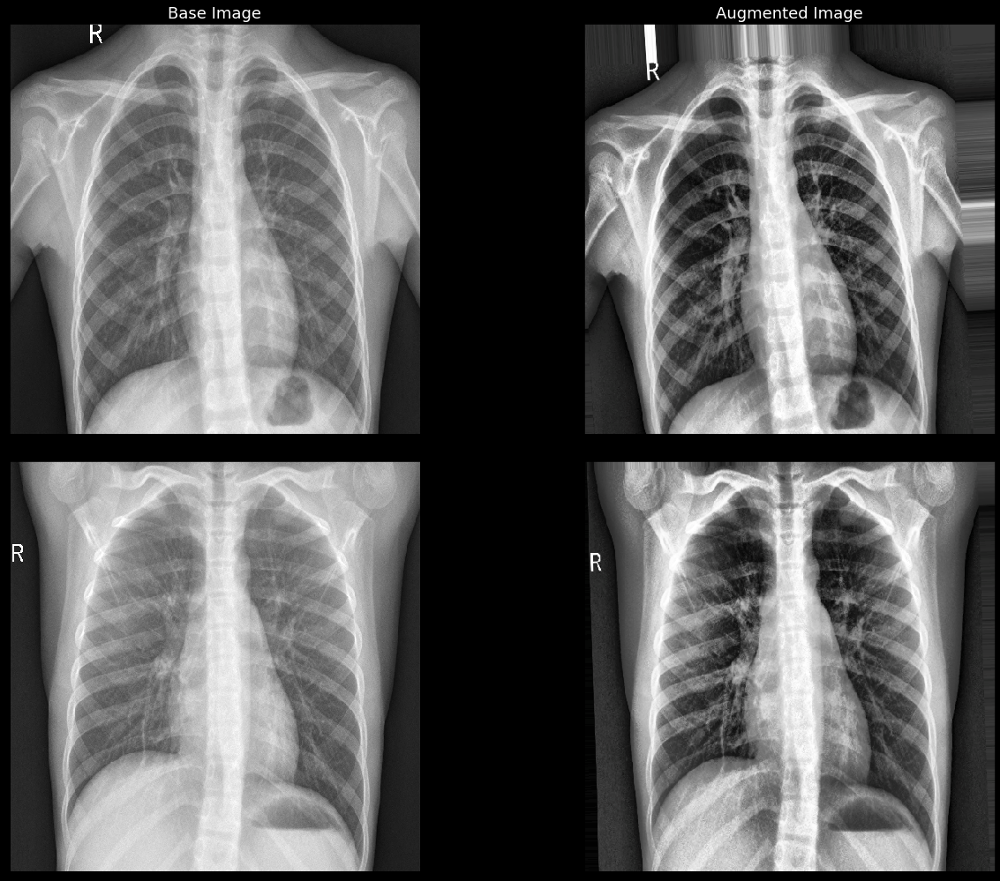

In [177]:
from tensorflow.keras.preprocessing.image import array_to_img

fig, axes = plt.subplots(2, 2, figsize = (20,70), facecolor='black')

for i in range(2):
    axes[i, 0].imshow(array_to_img(images_to_augment[i]), 
                      interpolation='nearest')
    
    axes[i, 1].imshow(array_to_img(images_augmented[i]), 
                      interpolation='nearest')
    
    axes[i, 0].set_xticks([])
    axes[i, 1].set_xticks([])
    
    axes[i, 0].set_yticks([])
    axes[i, 1].set_yticks([])
    
columns = ['Base Image', 'Augmented Image']
for ax, column in zip(axes[0], columns):
    ax.set_title(column, color='white') 

plt.savefig('finaL_aug_img.png', dpi=300, bbox_inches='tight')
plt.subplots_adjust(wspace=0.4, hspace=-0.85)
plt.show()

The augmented image is the final image that will be fed into our deep learning model.

In [38]:
def feed_data(dataset):
    
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)  
    return dataset

The feed_data function has the following structure:
- Arguments *(tf.Dataset)* : A dataset that needs to fed to the model.
- Returns *(tf.Dataset)* : A  prefetched dataset 

<h2>3. Model Creation</h2>

In this section we will be creating our deep learning model architecture and also define hyperparameters which will be used for parameter tuning.

<h4>3.1 Creating the Model Architecture</h4>

In [39]:
# Define the CNN Keras model
def create_model():
    
    # Model input
    input_layer = layers.Input(shape=(512, 512, 1), name='input')    

    # First block
    x = layers.Conv2D(filters=64, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_1')(input_layer)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_1')(x)
    x = layers.Dropout(0.1, name='dropout_1')(x)
    
    # Second block
    x = layers.Conv2D(filters=96, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_2')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_2')(x)
    x = layers.Dropout(0.1, name='dropout_2')(x)

    # Third block
    x = layers.Conv2D(filters=128, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_3')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_3')(x)
    x = layers.Dropout(0.1, name='dropout_3')(x)
    
    # Fourth block
    x = layers.Conv2D(filters=160, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_4')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_4')(x)
    x = layers.Dropout(0.1, name='dropout_4')(x)

    # Fifth block
    x = layers.Conv2D(filters=192, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_5')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_5')(x)
    x = layers.Dropout(0.1, name='dropout_5')(x)
    
    # Sixth block
    x = layers.Conv2D(filters=224, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_6')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_6')(x)
    x = layers.Dropout(0.1, name='dropout_6')(x)
    
    # Seventh block
    x = layers.Conv2D(filters=256, kernel_size=3, 
                      activation='relu', padding='same', 
                      name='conv2d_7')(x)
    x = layers.MaxPool2D(pool_size=2, name='maxpool2d_7')(x)
    x = layers.Dropout(0.1, name='dropout_7')(x)

    # Pooling and output
    x = layers.GlobalAveragePooling2D(name='global_average_pooling2d')(x)    
    output = layers.Dense(units=1, 
                          activation='sigmoid', 
                          name='output')(x)

    # Model creation and compilation
    
    model = Model (input_layer, output)    
    model.compile(optimizer='adam', 
                  loss='binary_crossentropy', 
                  metrics=['accuracy'])

    return model

In [40]:
# Create a Model object
model = create_model()

In [41]:
# See the layer and parameter summary
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 512, 512, 1)]     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 512, 512, 64)      640       
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 256, 256, 64)      0         
                                                                 
 dropout_1 (Dropout)         (None, 256, 256, 64)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 256, 256, 96)      55392     
                                                                 
 maxpool2d_2 (MaxPooling2D)  (None, 128, 128, 96)      0         
                                                                 
 dropout_2 (Dropout)         (None, 128, 128, 96)      0     

In [42]:
from tensorflow.keras.utils import plot_model

# See graphical representation of the model
plot_model(model, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


<h4>3.2 Hyperparameter Tuning</h4>

In [43]:
# Set up exponential learning rate decay
def lr_decay(epoch):
    
    initial_lr = 0.001    
    lr = initial_lr * np.exp(-0.1 * epoch)
    return lr

We created three callbacks for training in our implementation. The first callback is the *LearningRateScheduler*, which schedules the learning rate to decrease over time. The second callback is a *CSVLogger* object, which saves the results of each epoch to a CSV file. The third callback is a *ModelCheckpoint* object, which saves the weights of the model after each epoch.

In [44]:
# Import classes for metric saving, model saving, and LR reduction
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint, LearningRateScheduler

lr_scheduler = LearningRateScheduler(lr_decay, 1)
csv_logger = CSVLogger(filename='model_performance.csv')
model_checkpoint = ModelCheckpoint(filepath='checkpoint/model_performance_checkpoint_{epoch:04d}.hdf5')

Next, we need to define the number of training and validation steps.

In [45]:
# Calculate the number of steps for training and validation
train_steps = train_gen.samples // BATCH_SIZE
val_steps = val_gen.samples // BATCH_SIZE

<h4>3.3 Model Training</h4>

In [46]:
'''
history = model.fit(feed_data(train_data),                    
                    epochs=30,                    
                    steps_per_epoch=train_steps,                    
                    validation_data=(feed_data(val_data)),
                    validation_steps=val_steps,                    
                    shuffle=False,
                    callbacks=[lr_scheduler, csv_logger, model_checkpoint])'''

'\nhistory = model.fit(feed_data(train_data),                    \n                    epochs=30,                    \n                    steps_per_epoch=train_steps,                    \n                    validation_data=(feed_data(val_data)),\n                    validation_steps=val_steps,                    \n                    shuffle=False,\n                    callbacks=[lr_scheduler, csv_logger, model_checkpoint])'

<h2>4. Result Analysis</h2>

In this section we will look at various graphs and statistics which will show how well our model is performing

In [47]:
# Load the weights of a pretrained model
model.load_weights('checkpoint/model_performance_checkpoint_0023.hdf5')

In [48]:
# Loading the csv file containing the model performance information
model_perfomance = pd.read_csv("model_performance.csv")

Let's plot the variation of the training and validation accuracy with the number of epochs

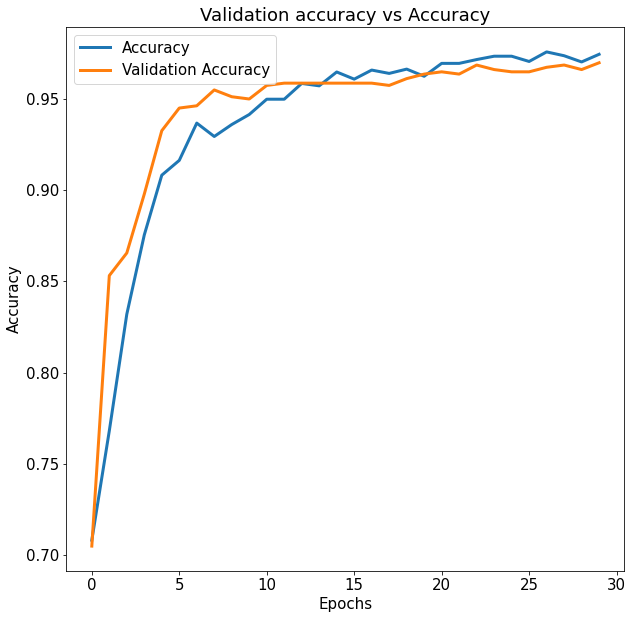

In [164]:
#Plot graph of accuracy and val_accuracy vs. number of epochs
plt.plot(model_perfomance['epoch'], model_perfomance['accuracy'], label='Accuracy')
plt.plot(model_perfomance['epoch'], model_perfomance['val_accuracy'], label='Validation Accuracy')
plt.title('Validation accuracy vs Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot.png', dpi=300, bbox_inches='tight')
plt.show()

Let's plot the variation of the training and validation loss with the number of epochs

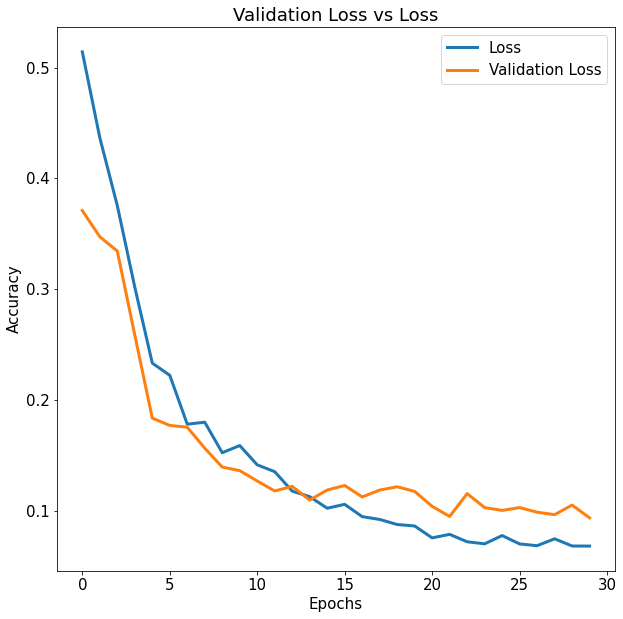

In [165]:
#Plot graph of loss and val_loss vs. number of epochs
plt.plot(model_perfomance['epoch'], model_perfomance['loss'], label='Loss')
plt.plot(model_perfomance['epoch'], model_perfomance['val_loss'], label='Validation Loss')
plt.title('Validation Loss vs Loss')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('loss_plot.png', dpi=300, bbox_inches='tight')
plt.show()

Lets now test our model on the test data.

Here we have tested our model on both the normal test data as well as the augmented test data. This has been done to check if the model is robust enough to be able to idenitfy augmented images.

In [51]:
# Evaluate the model on the test set
test_steps = test_gen.samples // BATCH_SIZE
model.evaluate(test_data, steps=test_steps)

# Declare an image generator on test data for augmented images

datagen = ImageDataGenerator(rescale = 1./255,
                             zoom_range=0.1, 
                             height_shift_range=0.05, 
                             width_shift_range=0.05,
                             rotation_range=5
                            )

test_aug_gen = datagen.flow_from_dataframe(test_df,
                                           target_size=(512, 512),
                                           color_mode='grayscale',
                                           batch_size=BATCH_SIZE,
                                           class_mode='binary',
                                           shuffle=False)

test_aug_data = tf.data.Dataset.from_generator(lambda: test_aug_gen,
                                           output_types=(tf.float32, tf.int32),
                                           output_shapes=([None, 512, 512, 1], [None, ]))

# Evaluate the model on augmented test data
test_aug_steps = test_aug_gen.samples // BATCH_SIZE
model.evaluate(test_aug_data, steps=test_aug_steps)

27/27 [==============================] - 54s 2s/step - loss: 0.0877 - accuracy: 0.9711
Found 879 validated image filenames belonging to 2 classes.
27/27 [==============================] - 60s 2s/step - loss: 0.0822 - accuracy: 0.9722


[0.08218859881162643, 0.9722222089767456]

In [52]:
# Calculate precision and recall based on  test data

precision = tf.keras.metrics.Precision()
recall = tf.keras.metrics.Recall()

predictions = model.predict(test_data, steps=test_steps).flatten()
y_true = test_gen.classes[:len(predictions)]

precision.update_state(y_true, predictions)
recall.update_state(y_true, predictions)

27/27 [==============================] - 58s 2s/step


In [53]:
print('Precision with base test data:', precision.result().numpy())
print('Recall with base test data:', recall.result().numpy())

Precision with base test data: 0.96850395
Recall with base test data: 0.9919355


In [54]:
# Calculate precision and recall based on augmented test data

precision.reset_states()
recall.reset_states()

predictions_aug = model.predict(test_aug_data, steps=test_steps).flatten()
y_true = test_gen.classes[:len(predictions_aug)]

precision.update_state(y_true, predictions_aug)
recall.update_state(y_true, predictions_aug)

27/27 [==============================] - 59s 2s/step


In [55]:
print('Precision with augmented test data:', precision.result().numpy())
print('Recall with augmented test data:', recall.result().numpy())

Precision with augmented test data: 0.9625
Recall with augmented test data: 0.9935484


We can observe that our model can achieve a high recall and precission value on both the base test data as well as the augmented test data. This signifies that our model is robust and can adapt well to changes.

Let's now create a Confusion Matrix inorder to asses the number of False Positives and False Negatives.

In [56]:
predictions.shape

(864,)

In [57]:
len(y_true)

864

In [58]:
from sklearn.metrics import confusion_matrix

confusion_mat = confusion_matrix(y_true, predictions > 0.75)

Here we have taken the threshold value to be 0.75. We will explore the reason behind this decision later in the notebook.

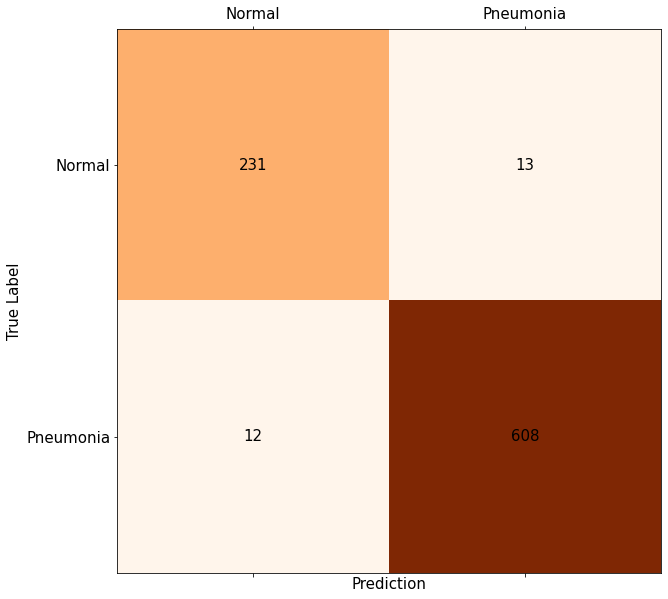

In [166]:
fig, ax = plt.subplots()

ax.matshow(confusion_mat, cmap=plt.cm.Oranges)

ax.set_xlabel('Prediction')
ax.set_ylabel('True Label')

tick_labels = ['Normal', 'Pneumonia']

ax.set_xticks(range(len(tick_labels)))
ax.set_yticks(range(len(tick_labels)))
ax.set_xticklabels(tick_labels)
ax.set_yticklabels(tick_labels)

for i in range(len(tick_labels)):
    for j in range(len(tick_labels)):
        ax.text(j, i, confusion_mat[i, j],
               ha='center', va='center')
        
plt.savefig('cm.png', dpi=300, bbox_inches='tight')
plt.show()

By observing the confusion matrix can see that our model has made the following predictions:
1. TN = 608 : Correctly identified 608 pneumonia images as pneumonia (True Positive)
2. TP = 231 : Correctly identified 231 normal images as normal (True Negative)
3. FN = 13 : Incorrectly identified 13 normal images as pneumonia (False Positive)
4. FP = 12 : Incorrectly idenitified 12 pneumonia images as normal (False Negative)

Accuracy = (TP + TN) / (TP + TN + FP + FN)
         = (608 + 231) / (608 + 231 + 13 + 12)
         = 839 / 864

This means that our model has an accuracy of 97.11 % 

Lets verify this by generating the classification report

In [60]:
from sklearn.metrics import classification_report

# y_true: true labels
# y_pred: predicted labels
target_names = ['Normal','Pneumonia'] # list of target names, in order of indices

# generate classification report
print(classification_report(y_true, predictions > 0.75, target_names=target_names))

              precision    recall  f1-score   support

      Normal       0.95      0.95      0.95       244
   Pneumonia       0.98      0.98      0.98       620

    accuracy                           0.97       864
   macro avg       0.96      0.96      0.96       864
weighted avg       0.97      0.97      0.97       864



Now lets visualise some images that were used to test the model and see what the model's predictions were.

In [61]:
from tensorflow.keras.preprocessing.image import array_to_img

def plot_image(image, prediction, label):
    
    label_names = ['Normal', 'Pneumonia']    
        
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.imshow(array_to_img(image * 255), interpolation='nearest', cmap='gray')
    
    if prediction <= 0.75:
        predicted_label = 0
    else:
        predicted_label = 1

    if predicted_label == label:
        color = 'blue'
    else:
        color = 'red' 
    
    plt.xlabel("Predicted Label: {}\n Probability: {:2.02f}% \n Actual Label: {}".format(label_names[predicted_label], 100 * prediction[0], label_names[label]), color=color, fontsize = 14)

If the model makes an incorrect prediction, the image label is displayed in red otherwise it is displayed in blue.

1/1 [==============================] - 2s 2s/step


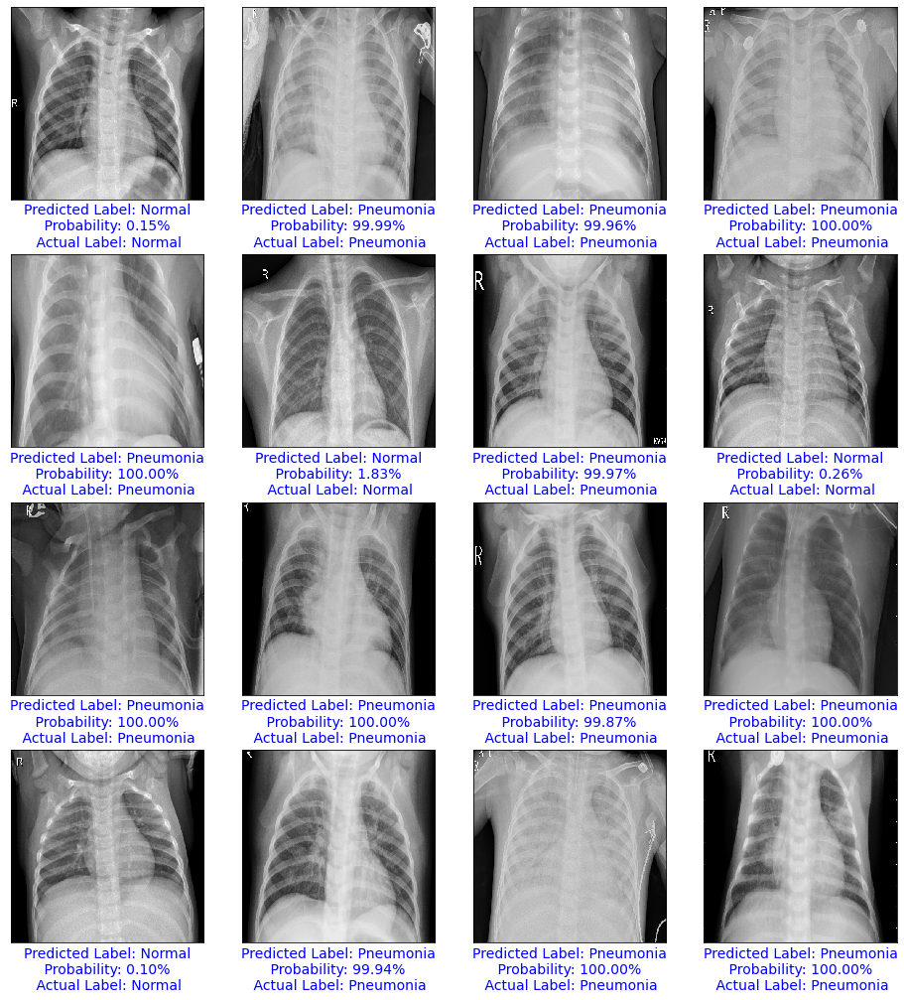

In [62]:
images, labels = next(iter(test_data))
y_pred = model.predict(images)
num_rows = 4
num_cols = 4
num_images = num_rows * num_cols
plt.figure(figsize=(2*2*num_cols, 2.2*2*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, num_cols, i+1)
    plot_image(images[i], y_pred[i], labels[i])
plt.show()

Above I have used a threshold value of 0.75. For a better look, let's see how the metrics change with a few thresholds values.

In [63]:
def calculate_metrics(predictions, labels, threshold):

    
    precision = tf.keras.metrics.Precision(thresholds=threshold)
    recall = tf.keras.metrics.Recall(thresholds=threshold)
    binary_accuracy = tf.keras.metrics.BinaryAccuracy(threshold=threshold)        
    
    precision.update_state(y_true, predictions) 
    recall.update_state(y_true, predictions)     
    binary_accuracy.update_state(y_true, predictions) 
        
    return precision.result().numpy(), recall.result().numpy(), binary_accuracy.result().numpy()

We check for all threshold values between 0 and 100

In [64]:
thresholds = np.linspace(0, 1, 100)

precisions, recalls, binary_accuracies = [], [], []

In [66]:
y_true = test_gen.classes[:len(predictions_aug)]
for threshold in thresholds:
    precision, recall, binary_accuracy = calculate_metrics(predictions, y_true, threshold)
    
    precisions.append(precision)
    recalls.append(recall)
    binary_accuracies.append(binary_accuracy)

In [167]:
def plot_metrics(precisions, recalls, accuracies, thresholds):
    
    plt.plot(thresholds, precisions, label='Precison')
    plt.plot(thresholds, recalls, '--', label='Recall')
    plt.plot(thresholds, accuracies,'-.', label='Accuracy')
    plt.axvline(x=0.75, color='black', label = 'Optimal Threshold Value')
    
    plt.xticks(np.linspace(0, 1, 10))
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.ylim([0.7, 1])
    plt.grid()
    plt.legend()
    plt.title('The Dependence Of Metric Scores On The Decision Threshold')
    plt.savefig('threshold_value.png', dpi=300, bbox_inches='tight')
    plt.show()

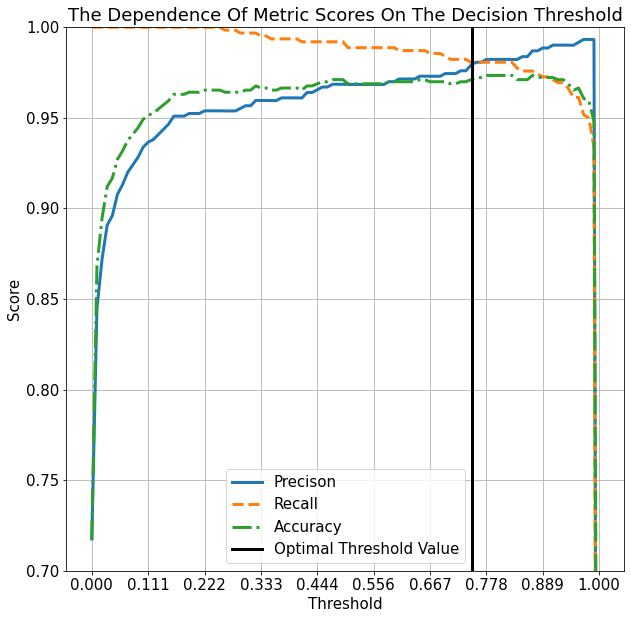

In [168]:
plot_metrics(precisions, recalls, binary_accuracies, thresholds)

As we can see, precision is low with low thresholds and high with high thresholds. The dependence for recall is inverse - it's the highest when the threshold is 0 and the lowest when it's 1. 

From this graph, we can notice that we achieve a good balance between Precision, Recall and Accuracy for a threshold value around 0.75

<h2>5. Grad-CAM Visualisation</h2>

And finally, let's have a look at the Grad-CAMs.

In [69]:
# pip install https://github.com/raghakot/keras-vis/archive/master.zip

In [70]:
print(type(test_data))

<class 'tensorflow.python.data.ops.dataset_ops.FlatMapDataset'>


In [81]:
# from vis.visualization import visualize_cam, visualize_saliency, visualize_activation, overlay
# from vis.utils import utils

images, labels = next(iter(test_data))
predictions = model.predict(images)


1/1 [==============================] - 2s 2s/step


In [82]:
predictions[predictions > 0.5] = 1
predictions[predictions <= 0.5] = 0
predictions = np.squeeze(predictions)

In [83]:
print(predictions.shape)

(32,)


In [172]:
def visualise_cams(images, predictions, labels, model):
    # Define the last convolutional layer
    last_conv_layer = model.get_layer('conv2d_7')

    # Define the gradient model
    gradient_model = tf.keras.models.Model(
        [model.inputs], [last_conv_layer.output, model.output]
    )

    # Iterate through the images, predictions and labels
    for i, (image, pred, label) in enumerate(zip(images, predictions, labels)):
        # Get the image ready for the model
        image = np.expand_dims(image, axis=0)

        # Generate the Grad-CAM for the predicted class
        with tf.GradientTape() as tape:
            conv_outputs, predictions = gradient_model(image)
            loss = predictions[:]

        output = conv_outputs[0]
        grads = tape.gradient(loss, conv_outputs)[0]

        # Compute the guided gradients
        gate_f = tf.cast(output > 0, 'float32')
        gate_r = tf.cast(grads > 0, 'float32')
        guided_grads = gate_f * gate_r * grads

        # Average the gradients spatially
        weights = tf.reduce_mean(guided_grads, axis=(0, 1))

        # Compute the CAM by multiplying the average feature map with the weights
        cam = tf.reduce_sum(tf.multiply(weights, output), axis=-1)

        # Normalise the CAM
        cam = np.maximum(cam, 0)
        if np.max(cam) > 0:
            cam = cam / np.max(cam)
        else:
            cam = np.zeros_like(cam)

        # Resize the CAM to the original image size
        cam = cv2.resize(cam, (512, 512))

        # Set the label and prediction text
        label_text = "Normal" if label == 0 else "Pneumonia"
        pred_text = "Normal" if pred == 0 else "Pneumonia"

        # Plot the original image and the CAM
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))#, facecolor = 'black')
        ax1.imshow(np.squeeze(image), cmap='gray')
        ax1.set_title(f"Actual Label: {label_text}")#, color='white')
        ax2.imshow(np.squeeze(image), cmap='gray')
        ax2.imshow(cam, cmap='jet', alpha=0.5)
        ax2.set_title(f"Predicted Label: {pred_text}")#, color='white')
        ax1.set_axis_off()
        ax2.set_axis_off()
        plt.show()


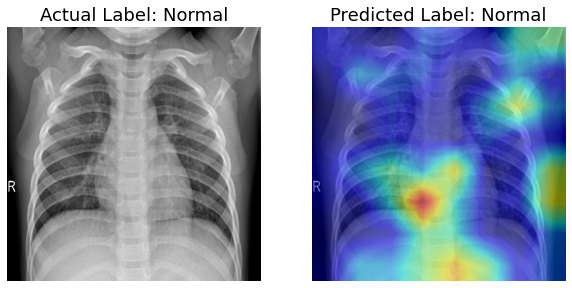

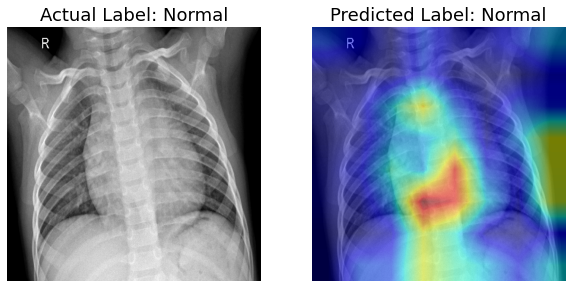

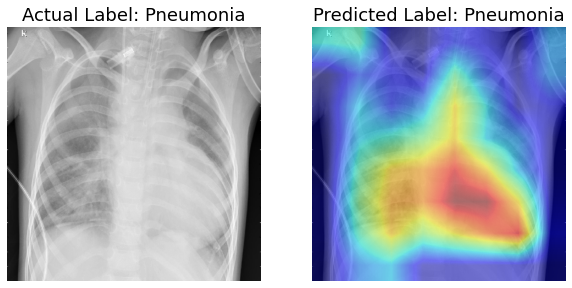

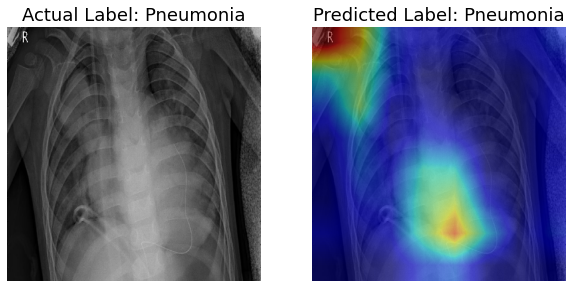

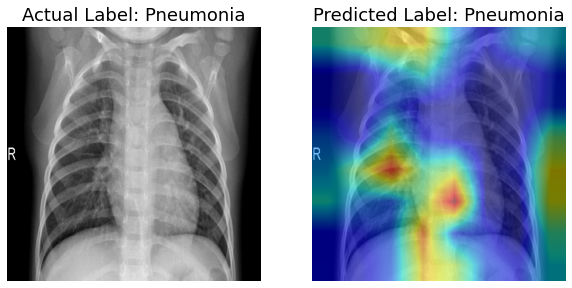

...

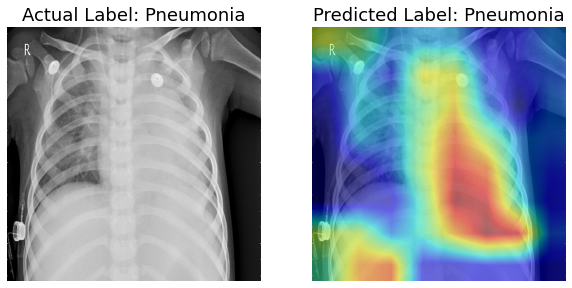

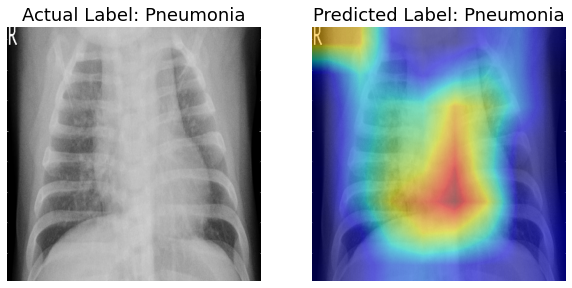

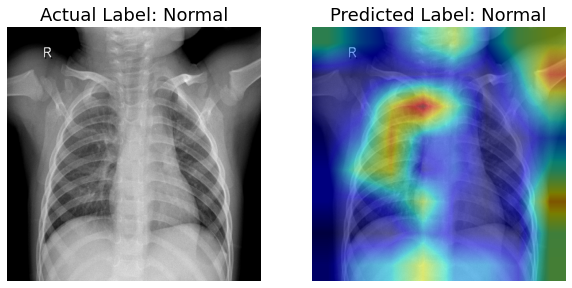

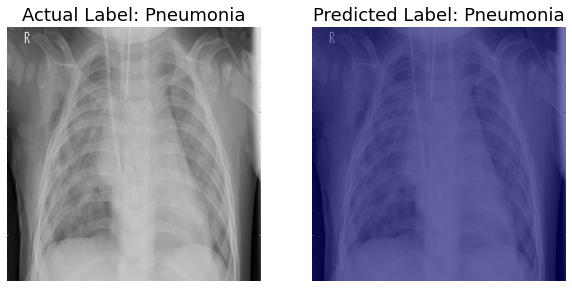

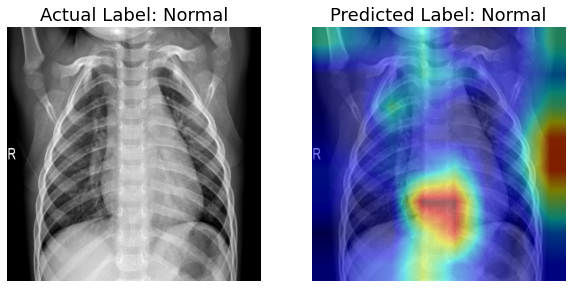

In [173]:
# Visualize Grad-CAMs
visualise_cams(images, predictions, labels, model)

From observing the GradCAM's, we can infer that in majority cases the model is able to correctly identify and locate the affected regions in the lung. However, in some GradCAM's we can observe that the upper left and right hand corners are being excessively highlighted. This can be considered as one of the shortcomings of this model. A potential solution would require a more thorough pre-processing of the chest X-ray image inorder to remove any unwanted features from the scan.